In [1]:
install.packages("gridExtra")
install.packages("lubridate")

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [2]:
#bibliotecas a serem utilizadas 
#visualização de RMSE no jupyter
library(ggplot2)
library(tidyverse)
#library to plot two or more plots in a grid
library(gridExtra)
library(repr)
library(lubridate)


Loading tidyverse: tibble
Loading tidyverse: tidyr
Loading tidyverse: readr
Loading tidyverse: purrr
Loading tidyverse: dplyr
Conflicts with tidy packages ---------------------------------------------------
filter(): dplyr, stats
lag():    dplyr, stats

Attaching package: ‘gridExtra’

The following object is masked from ‘package:dplyr’:

    combine


Attaching package: ‘lubridate’

The following object is masked from ‘package:base’:

    date



In [3]:
tsDia1=as.data.frame(read.table("../plumber/logNormalSerie.txt"))
names(tsDia1)=c("Dia1")

locf=as.data.frame(read.table("../expOriginal/resultados/df_locf.txt"))
inter=as.data.frame(read.table("../expOriginal/resultados/df_linear_interpolation.txt"))
interp=as.data.frame(read.table("../expOriginal/resultados/df_interp.txt"))
mean=as.data.frame(read.table("../expOriginal/resultados/df_mean.txt"))
median=as.data.frame(read.table("../expOriginal/resultados/df_median.txt"))
mode=as.data.frame(read.table("../expOriginal/resultados/df_mode.txt"))
malExp=as.data.frame(read.table("../expOriginal/resultados/df_movingAverage_exponential.txt"))
malLin=as.data.frame(read.table("../expOriginal/resultados/df_movingAverage_linear.txt"))
malSim=as.data.frame(read.table("../expOriginal/resultados/df_movingAverage_simple.txt"))
spl=as.data.frame(read.table("../expOriginal/resultados/df_spline_interpolation.txt"))
sti=as.data.frame(read.table("../expOriginal/resultados/df_stine_interpolation.txt"))
seadec=as.data.frame(read.table("../expOriginal/resultados/df_seadec.txt"))
seasplit=as.data.frame(read.table("../expOriginal/resultados/df_seasplit.txt"))
ssa=as.data.frame(read.table("../expOriginal (copy)/resultados//df_ssa.txt"))

names(inter)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(interp)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(locf)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(mean)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(median)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(mode)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(malExp)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(malLin)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(malSim)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(spl)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(sti)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(seadec)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(seasplit)=c("algoritmo" , "rmse", "mse", "mae", "mape")
names(ssa)=c("algoritmo" , "rmse", "mse", "mae", "mape")

todos=rbind(interp, inter, locf, mean, median, mode, malExp, malLin, malSim, spl, sti, seadec,seasplit, ssa)
#todos=rbind(malExp, malLin, malSim, seadec,seasplit)


In [4]:
todos$tamanho=rep(seq(100,10800,100), each=30)


In [5]:
head(todos)
summary(todos)

algoritmo,rmse,mse,mae,mape,tamanho
interp,0.016880750,2.849597e-04,0.013933996,0.03155698,100
interp,0.013755131,1.892036e-04,0.012189197,0.07527516,100
interp,0.008724705,7.612047e-05,0.007264747,0.01261077,100
interp,0.035092226,1.231464e-03,0.030979604,0.03185910,100
interp,0.008889017,7.901462e-05,0.007186881,0.02759596,100
interp,0.014588844,2.128344e-04,0.013040737,0.01854832,100


                algoritmo          rmse                mse          
 interp              : 3240   Min.   : 0.004758   Min.   :  0.0000  
 linear_interpolation: 3240   1st Qu.: 0.065937   1st Qu.:  0.0043  
 locf                : 3240   Median : 0.118099   Median :  0.0139  
 mean                : 3240   Mean   : 0.354274   Mean   :  1.0693  
 median              : 3240   3rd Qu.: 0.281448   3rd Qu.:  0.0792  
 mode                : 3240   Max.   :26.201487   Max.   :686.5179  
 (Other)             :25920                                         
      mae                 mape             tamanho     
 Min.   : 0.003611   Min.   :  0.0061   Min.   :  100  
 1st Qu.: 0.054185   1st Qu.:  0.1227   1st Qu.: 2775  
 Median : 0.099082   Median :  0.2863   Median : 5450  
 Mean   : 0.311531   Mean   :  1.6156   Mean   : 5450  
 3rd Qu.: 0.252350   3rd Qu.:  0.9232   3rd Qu.: 8125  
 Max.   :22.769164   Max.   :422.5827   Max.   :10800  
                                                       

In [6]:
summary(todos)

                algoritmo          rmse                mse          
 interp              : 3240   Min.   : 0.004758   Min.   :  0.0000  
 linear_interpolation: 3240   1st Qu.: 0.065937   1st Qu.:  0.0043  
 locf                : 3240   Median : 0.118099   Median :  0.0139  
 mean                : 3240   Mean   : 0.354274   Mean   :  1.0693  
 median              : 3240   3rd Qu.: 0.281448   3rd Qu.:  0.0792  
 mode                : 3240   Max.   :26.201487   Max.   :686.5179  
 (Other)             :25920                                         
      mae                 mape             tamanho     
 Min.   : 0.003611   Min.   :  0.0061   Min.   :  100  
 1st Qu.: 0.054185   1st Qu.:  0.1227   1st Qu.: 2775  
 Median : 0.099082   Median :  0.2863   Median : 5450  
 Mean   : 0.311531   Mean   :  1.6156   Mean   : 5450  
 3rd Qu.: 0.252350   3rd Qu.:  0.9232   3rd Qu.: 8125  
 Max.   :22.769164   Max.   :422.5827   Max.   :10800  
                                                       

In [7]:
todosMedia=todos %>%
  group_by(algoritmo, tamanho) %>%
  summarize(mean = mean(rmse, na.rm = TRUE))

sdTodosMedia = todos %>% group_by(algoritmo, tamanho) %>%
summarize(sd=sd(rmse, na.rm=TRUE))
todosMedia$sd=sdTodosMedia$sd

n=90 #tamanho da amostra. Ou seja, tem 30 lacunas de tamanho 100, 30 de tamanho 200...
error=qnorm(0.975)*todosMedia$sd/sqrt(n)
todosMedia$error=error
# The errorbars overlapped, so use position_dodge to move them horizontally
pd <- position_dodge(0.2) # move them .05 to the left and right

head(todosMedia)

algoritmo,tamanho,mean,sd,error
interp,100,0.01363039,0.006732779,0.001390981
interp,200,0.01819610,0.007422871,0.001533553
interp,300,0.02268847,0.008447936,0.001745330
interp,400,0.02739236,0.011030422,0.002278867
interp,500,0.02662368,0.009079320,0.001875773
interp,600,0.03259934,0.009148035,0.001889969


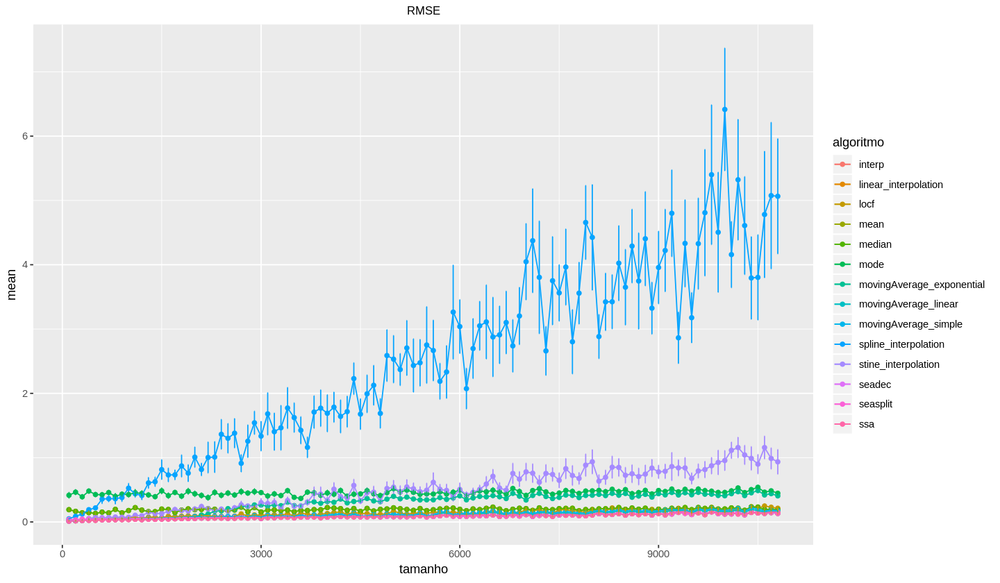

In [8]:
options(repr.plot.width=12)
rmse=ggplot(todosMedia, aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    ggtitle("RMSE")+  theme(plot.title = element_text(hjust = 0.5, size=9))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())
rmse

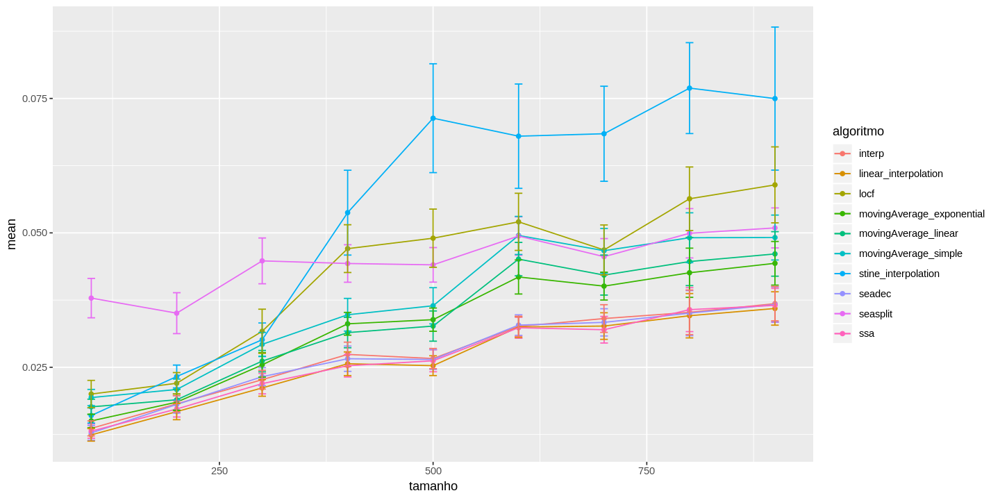

In [9]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$tamanho<1000 & todosMedia$algoritmo!="spline_interpolation" & todosMedia$algoritmo!="mode" & todosMedia$algoritmo!="mean" & todosMedia$algoritmo!="median"),], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

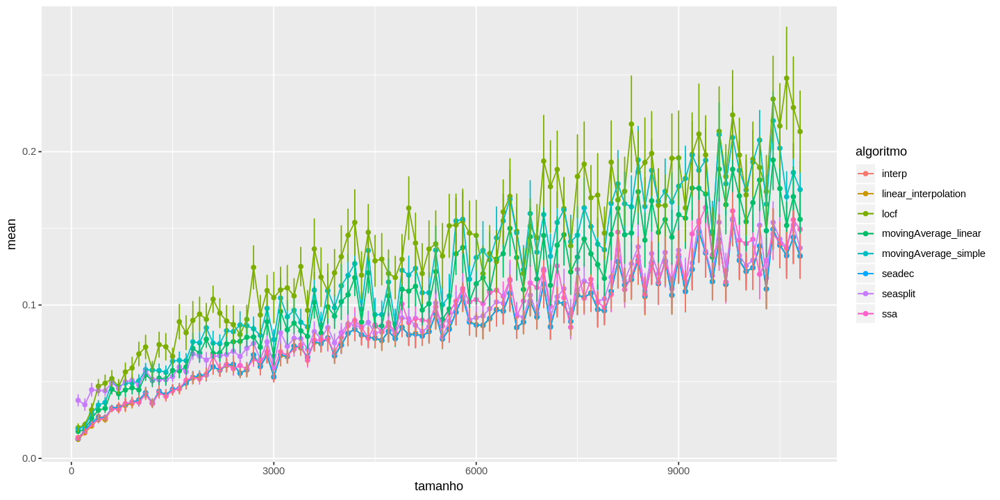

In [10]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo!="spline_interpolation" & todosMedia$algoritmo!="mode" & todosMedia$algoritmo!="mean" & todosMedia$algoritmo!="median" & todosMedia$algoritmo!="movingAverage_exponential" & todosMedia$algoritmo!="stine_interpolation" ) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

Comparação entre as médias móveis
===


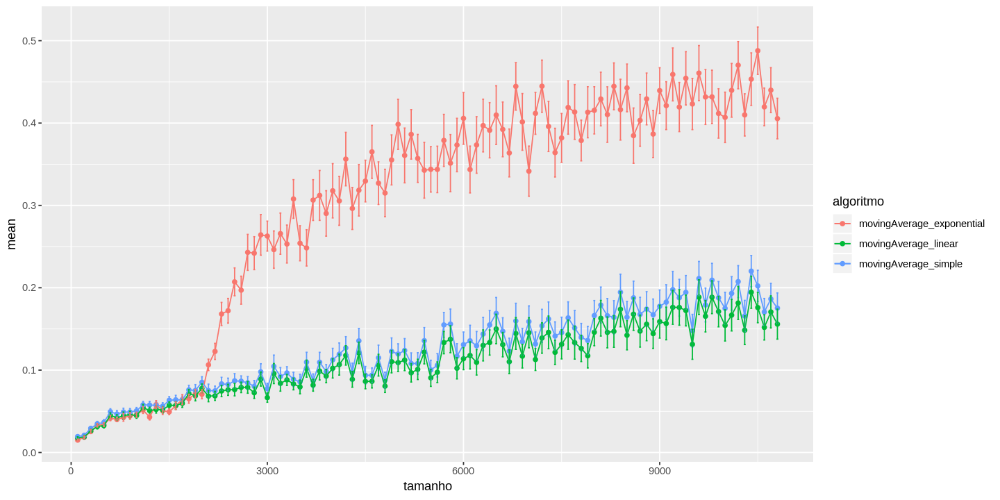

In [11]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="movingAverage_exponential") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

Comparação entre algoritmos rápidos
===
O melhor algoritmo rápido em relação ao RMSE é o Locf

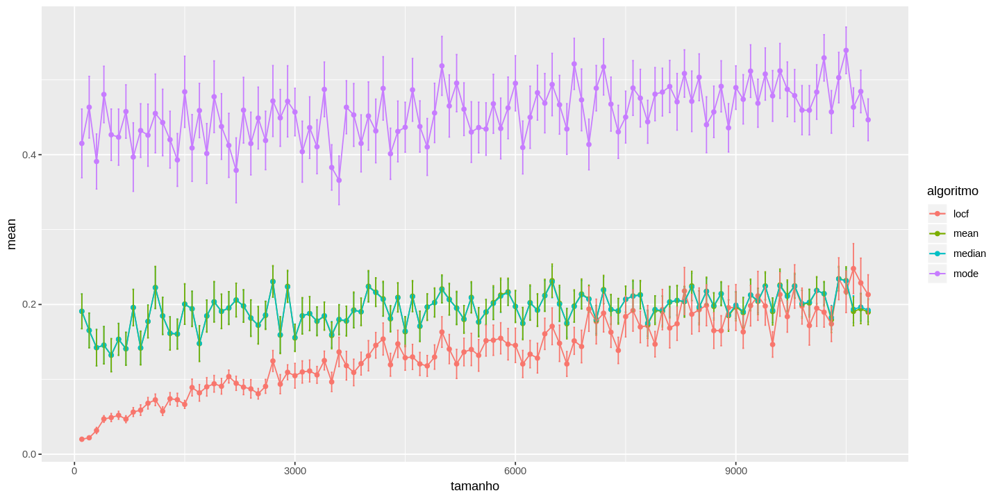

In [12]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="mean" | todosMedia$algoritmo=="median" | todosMedia$algoritmo=="locf" | todosMedia$algoritmo=="mode") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

Comparação entre interpolações
==
Spline tem o desempenho pobre ruim em relação ao stine


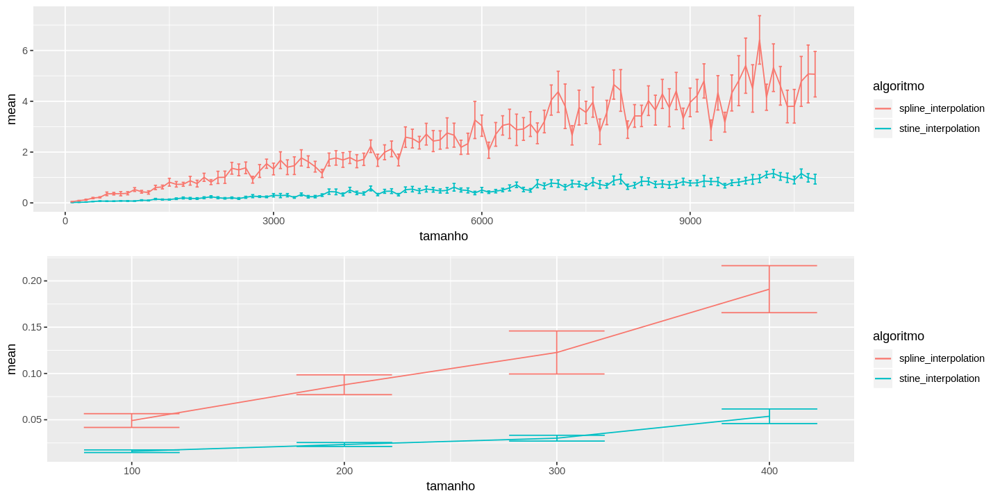

In [13]:
options(repr.plot.width=12)
 a=   ggplot(todosMedia[which((todosMedia$algoritmo=="spline_interpolation" | todosMedia$algoritmo=="stine_interpolation")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
b= ggplot(todosMedia[which((todosMedia$algoritmo=="spline_interpolation" | todosMedia$algoritmo=="stine_interpolation") & todosMedia$tamanho<500) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
grid.arrange(a,b, ncol=1)

Comparação entre os algoritmos mais robustos
==
Seadec e SSA são iguais estatisticamente. 
Resolveu-se utilizar apenas o seasplit. 

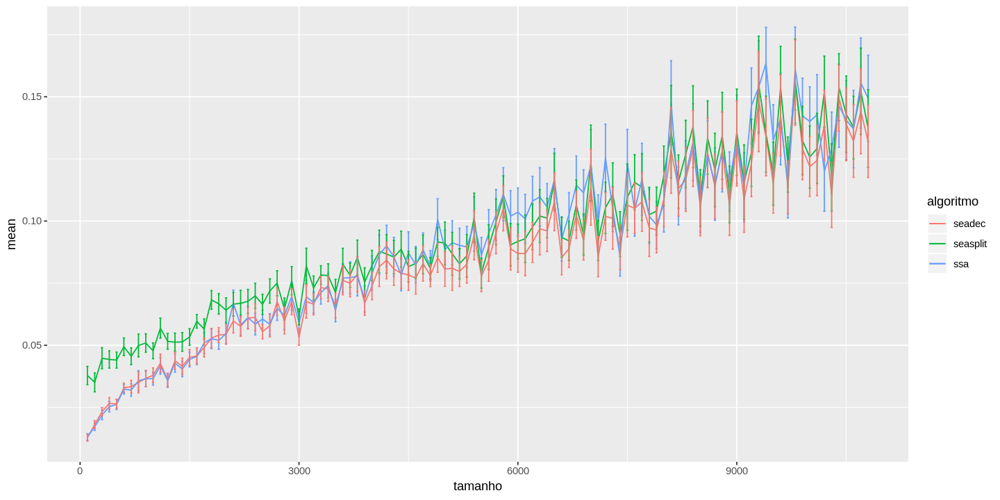

In [14]:
options(repr.plot.width=12)
 a=   ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="ssa")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
a

Comparação entre os melhores algoritmos de cada categoria
==

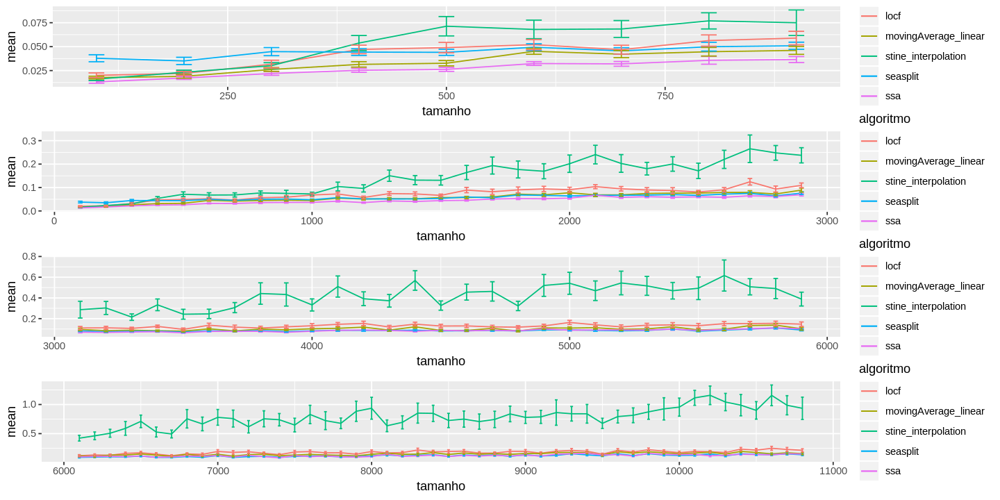

In [15]:

q0=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<1000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q0, q1, q2,q3, ncol=1)



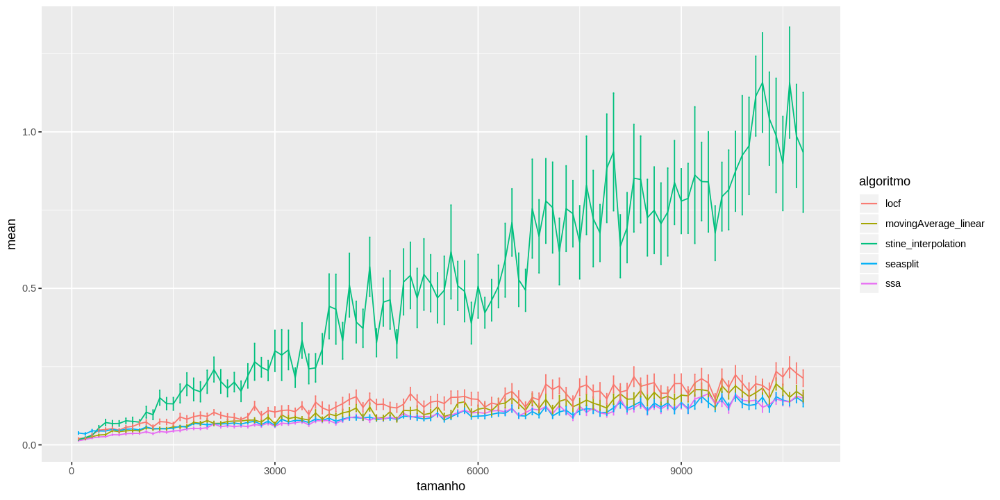

In [16]:
options(repr.plot.width=12, repr.plot.height=6)

rmseMelhores=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
rmseMelhores

Comparação enttre os melhores algoritmos de cada categoria
==
Sem Stine. 
NOTA:
--
SSA é o melhor algoritmo para lacunas grandes consecutivas até próximo a 3000 perdas. A partir daí, se iguala estatisticamente com seasplit e depois de 6000 ambos se igualam a media móvel linear 

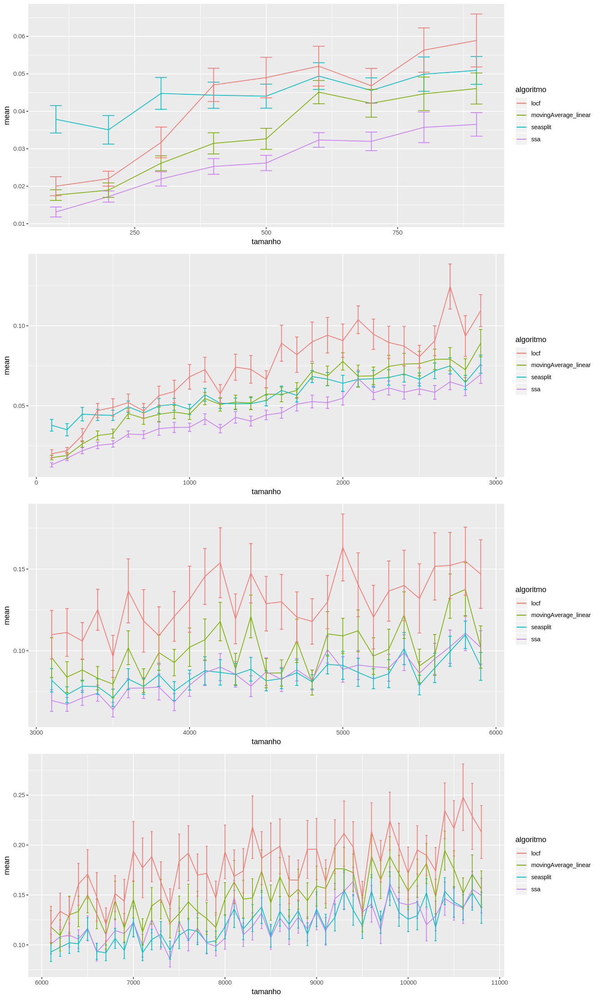

In [17]:
options(repr.plot.width=12, repr.plot.height=20)
q0=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<1000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q0, q1, q2,q3, ncol=1)

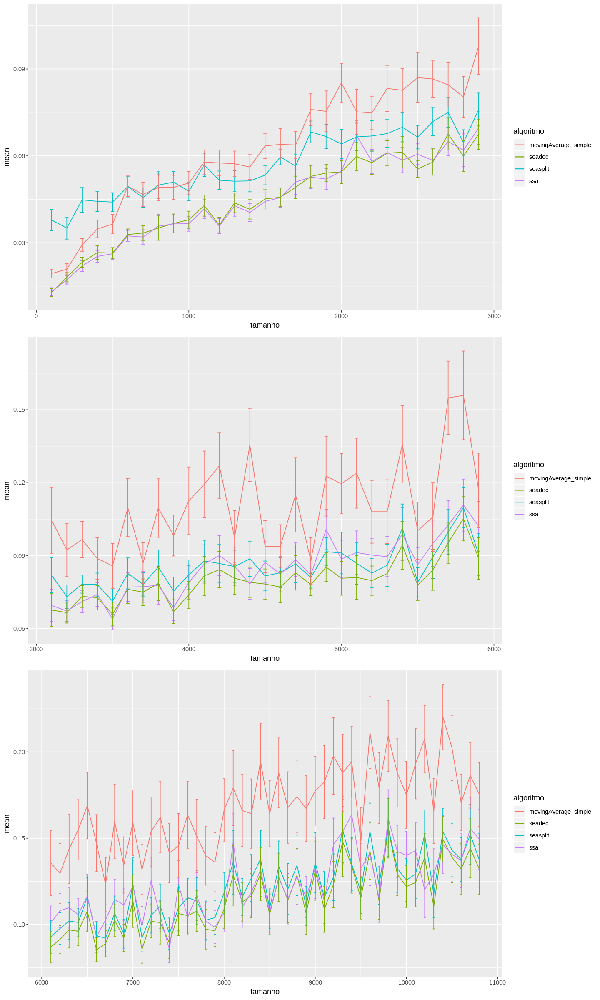

In [18]:
options(repr.plot.width=12, repr.plot.height=20)
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa")  & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q1, q2,q3, ncol=1)

Nota
---
Iterpolação, seadec e ssa são iguais estatisticamente


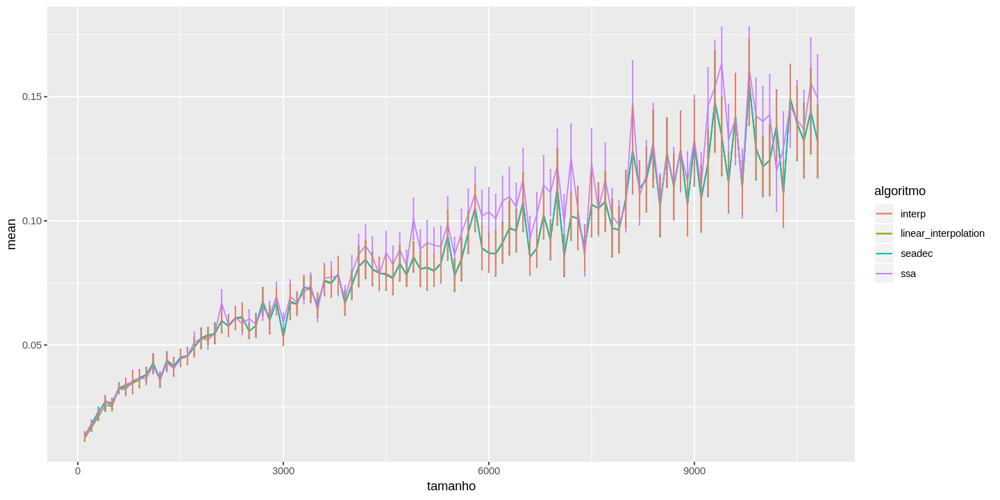

In [19]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="interp"| todosMedia$algoritmo=="linear_interpolation" | todosMedia$algoritmo=="seadec"| todosMedia$algoritmo=="ssa") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())


Nota
===
Os algoritmos Seasplit e SSA apresentam comportamentos distintos. 
De 100 a 3000 o SSA é melhor que o Seasplit, entretanto, após esse pontos os dois convergem para a igualdade. 

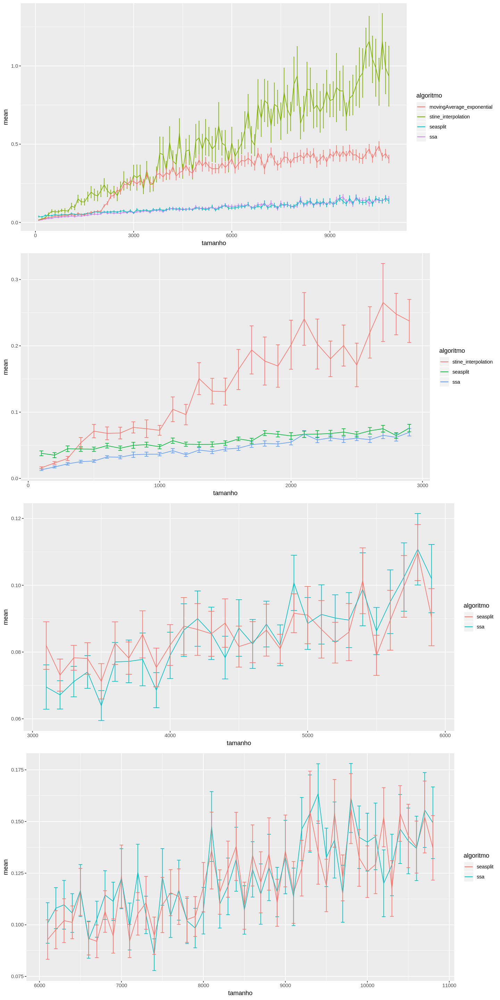

In [20]:
options(repr.plot.width=12, repr.plot.height=24)
   q1= ggplot(todosMedia[which(todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" |  todosMedia$algoritmo=="movingAverage_exponential" |  todosMedia$algoritmo=="stine_interpolation") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

q2=ggplot(todosMedia[which((todosMedia$tamanho<3000) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="stine_interpolation")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3=ggplot(todosMedia[which((todosMedia$tamanho>3000 & todosMedia$tamanho<6000 ) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" )) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

q4=ggplot(todosMedia[which((todosMedia$tamanho>6000) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())
grid.arrange(q1,q2,q3,q4, ncol=1)

In [21]:
a= todosMedia[which(todosMedia$algoritmo=="interp" | todosMedia$algoritmo=="linear_interpolation" | todosMedia$algoritmo=="seadec") ,]
by_alg=arrange(a, tamanho, mean)
by_alg=group_by(a, tamanho, algoritmo)
by_length=summarise(by_alg, media=min(mean))
a=by_length%>% filter(media==min(media))
a

tamanho,algoritmo,media
100,linear_interpolation,0.01242426
200,linear_interpolation,0.01675062
300,linear_interpolation,0.02115881
400,linear_interpolation,0.02565532
500,linear_interpolation,0.02529887
600,linear_interpolation,0.03248869
700,linear_interpolation,0.03266407
800,linear_interpolation,0.03458787
900,linear_interpolation,0.03593640
1000,seadec,0.03794836


Métrica: MAPE
---
Como pode ser visto abaixo os resultados do MAPE foram muito ruins! 


In [22]:
todosMedia=todos %>%
  group_by(algoritmo, tamanho) %>%
  summarize(mean = mean(mape, na.rm = TRUE))
#head(todosMedia)
sdTodosMedia = todos %>% group_by(algoritmo, tamanho) %>%
summarize(sd=sd(mape, na.rm=TRUE))
todosMedia$sd=sdTodosMedia$sd

n=90 #tamanho da amostra. Ou seja, tem 30 lacunas de tamanho 100, 30 de tamanho 200...
error=qnorm(0.975)*todosMedia$sd/sqrt(n)
todosMedia$error=error
# The errorbars overlapped, so use position_dodge to move them horizontally
pd <- position_dodge(0.2) # move them .05 to the left and right

head(todosMedia)



algoritmo,tamanho,mean,sd,error
interp,100,0.03735700,0.02661134,0.005497859
interp,200,0.03992885,0.02521403,0.005209177
interp,300,0.63388578,3.10946400,0.642410113
interp,400,0.05658240,0.03934521,0.008128655
interp,500,0.05925436,0.02964115,0.006123812
interp,600,0.08540392,0.06646808,0.013732196


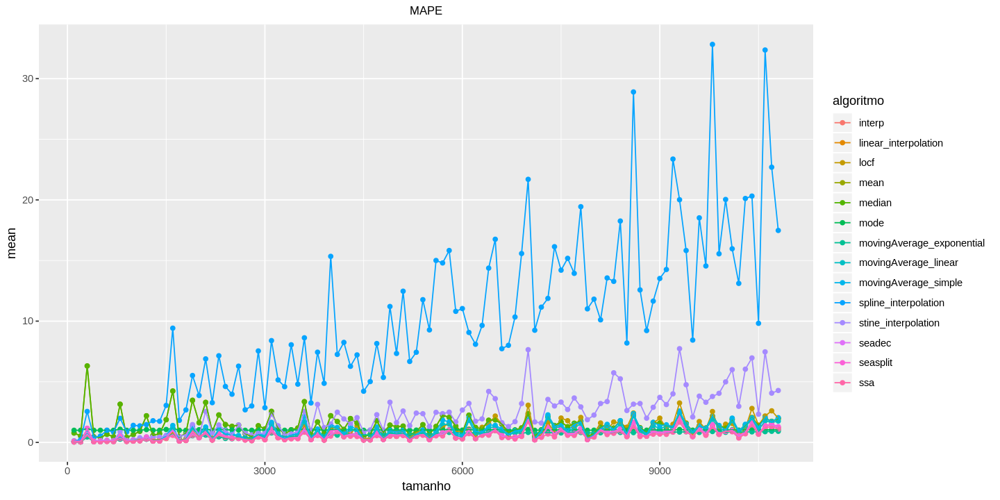

In [23]:
options(repr.plot.width=12, repr.plot.height=6)
mape=ggplot(todosMedia, aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    ggtitle("MAPE")+  theme(plot.title = element_text(hjust = 0.5, size=9))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
mape

Comparação entre as médias móveis
===
Média móvel exponencial tem melhores resultados e o intervalo de confiança menor que as outras médias móveis

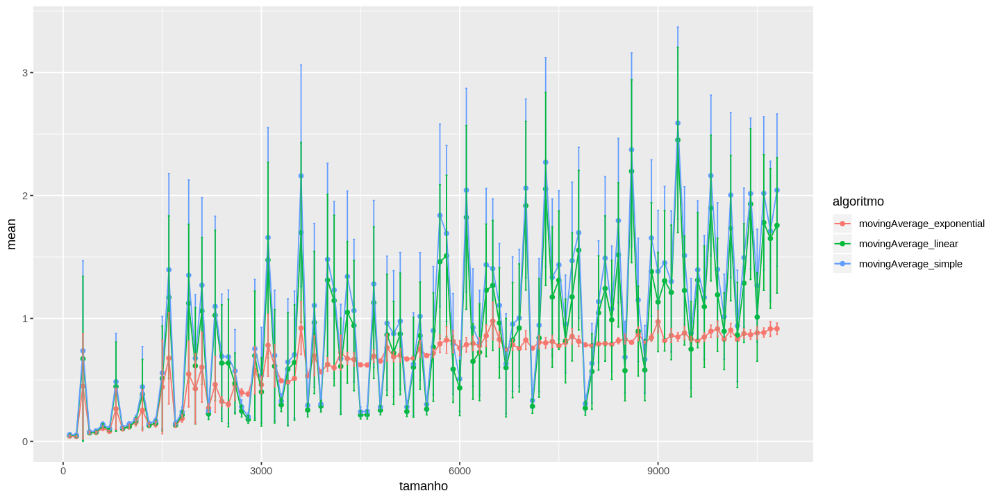

In [24]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="movingAverage_exponential") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))


Comparação entre algoritmos rápidos
===
O melhor algoritmo rápido em relação ao RMSE é o Locf até 3000, depois disso, iguala-se estatisticamente a outros algoritmos

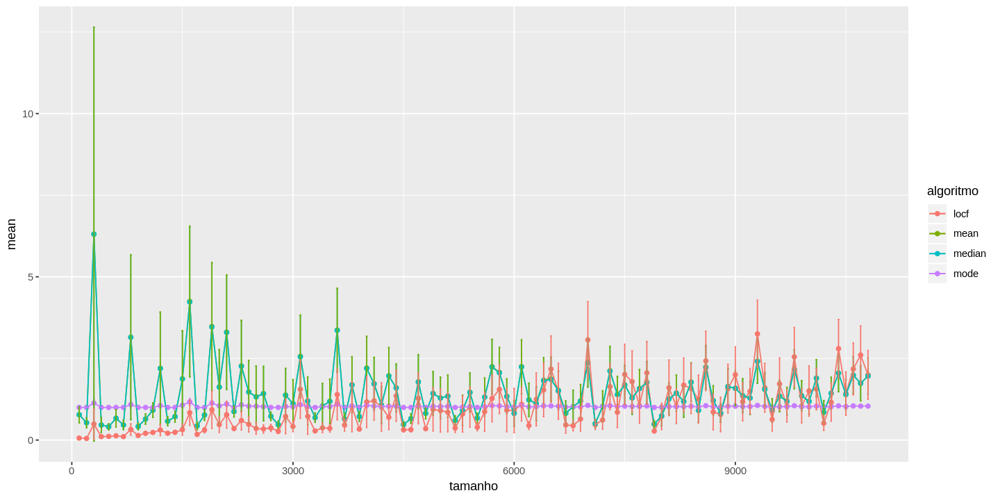

In [25]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="mean" | todosMedia$algoritmo=="median" | todosMedia$algoritmo=="locf" | todosMedia$algoritmo=="mode") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

Comparação entre interpolações
==
Spline tem o desempenho pobre ruim em relação ao stine


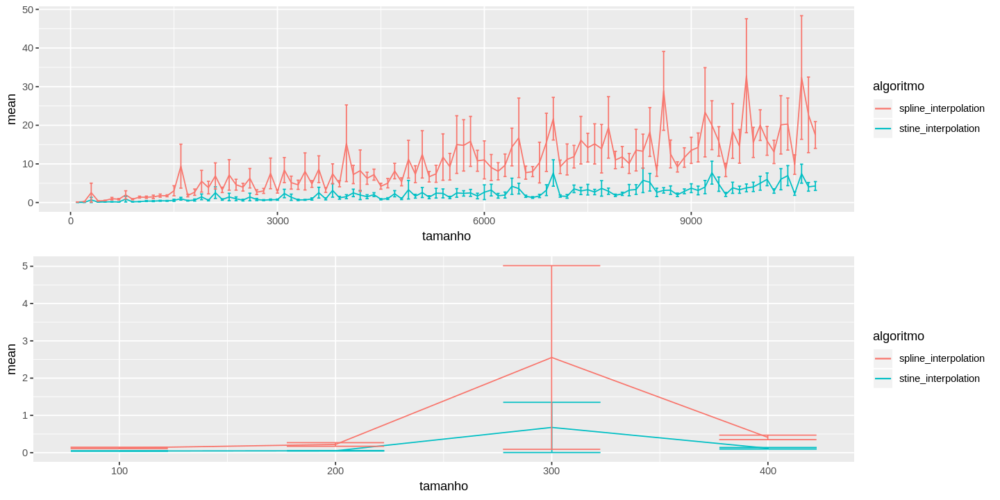

In [26]:
options(repr.plot.width=12)
 a=   ggplot(todosMedia[which((todosMedia$algoritmo=="spline_interpolation" | todosMedia$algoritmo=="stine_interpolation")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
b= ggplot(todosMedia[which((todosMedia$algoritmo=="spline_interpolation" | todosMedia$algoritmo=="stine_interpolation") & todosMedia$tamanho<500) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
grid.arrange(a,b, ncol=1)

Comparação entre os algoritmos mais robustos
==
Seadec e SSA são iguais estatisticamente. 
Resolveu-se utilizar apenas o seasplit. 

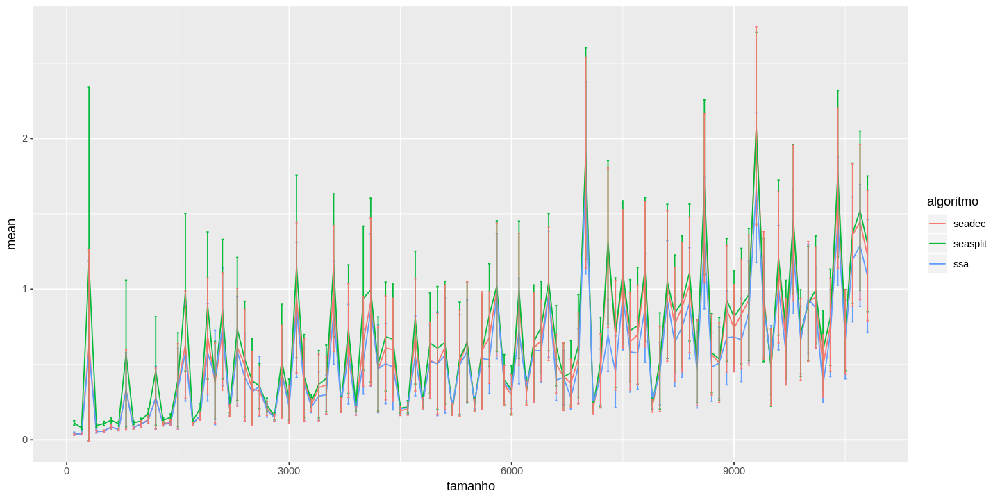

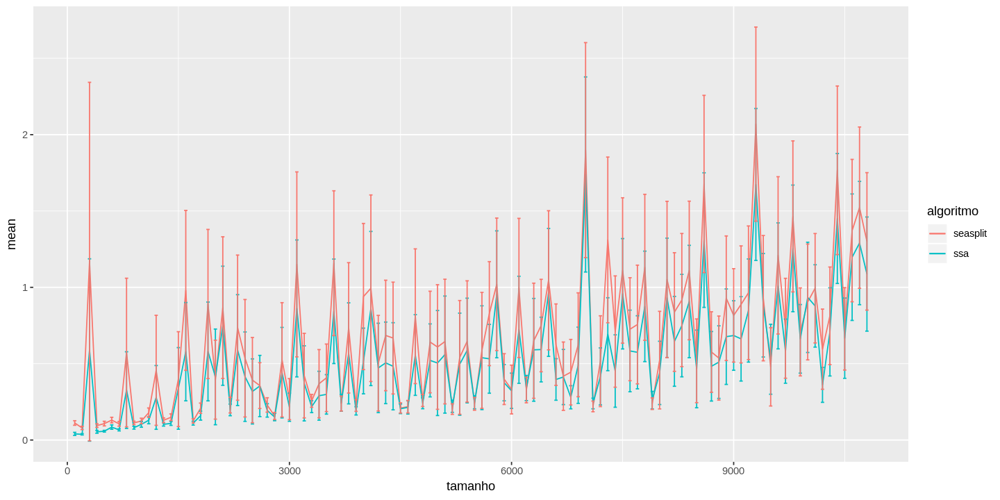

In [27]:
options(repr.plot.width=12)
 a=   ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="ssa")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
a

ggplot(todosMedia[which((todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="ssa")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

Comparação enttre os melhores algoritmos de cada categoria
==

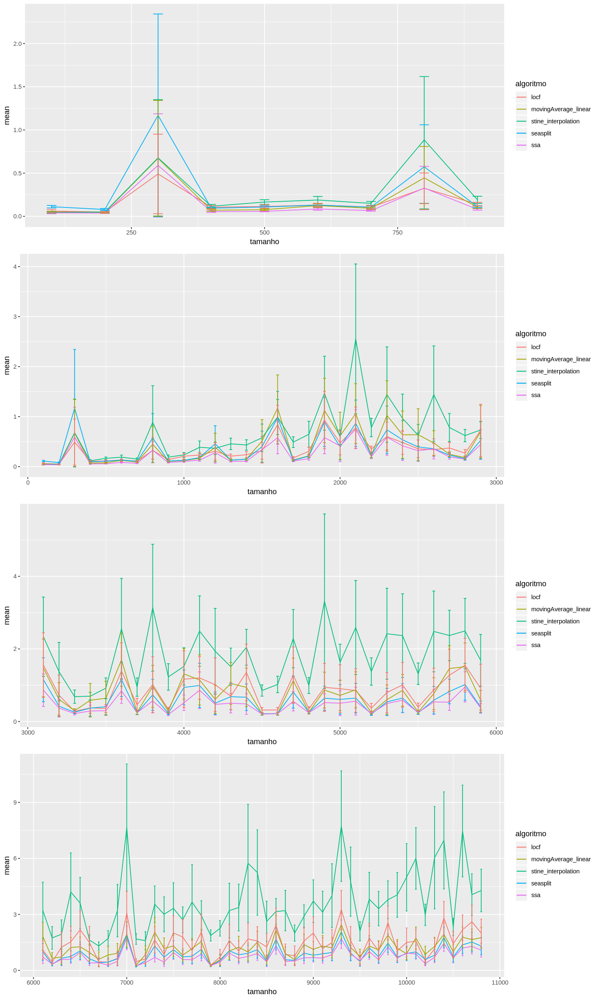

In [28]:
options(repr.plot.width=12, repr.plot.height=20)
q0=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<1000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="stine_interpolation" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q0, q1, q2,q3, ncol=1)

Comparação enttre os melhores algoritmos de cada categoria
==
Sem Stine. 
NOTA:
--
SSA é o melhor algoritmo para lacunas grandes consecutivas até próximo a 3000 perdas. A partir daí, se iguala estatisticamente com seasplit e depois de 6000 ambos se igualam a media móvel linear 

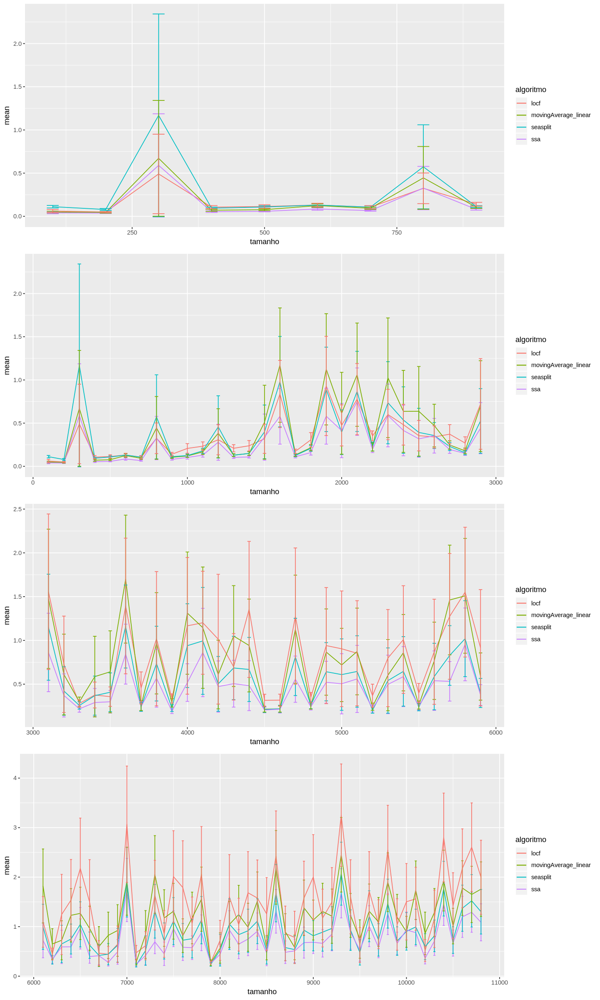

In [29]:
options(repr.plot.width=12, repr.plot.height=20)
q0=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<1000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_linear" | todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="locf") & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q0, q1, q2,q3, ncol=1)

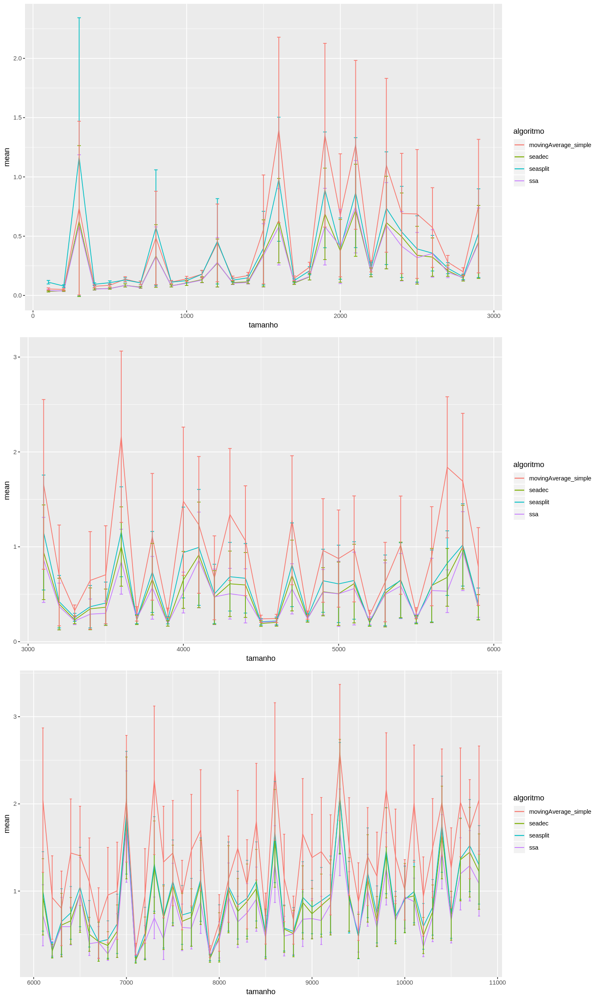

In [30]:
options(repr.plot.width=12, repr.plot.height=20)
q1=ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa") & todosMedia$tamanho<3000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())
q2=ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa") & todosMedia$tamanho>3000 & todosMedia$tamanho<6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3= ggplot(todosMedia[which((todosMedia$algoritmo=="seadec" | todosMedia$algoritmo=="seasplit" | todosMedia$algoritmo=="movingAverage_simple" | todosMedia$algoritmo=="ssa")  & todosMedia$tamanho>6000) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(q1, q2,q3, ncol=1)

Nota
---
Iterpolação, seadec e ssa são iguais estatisticamente


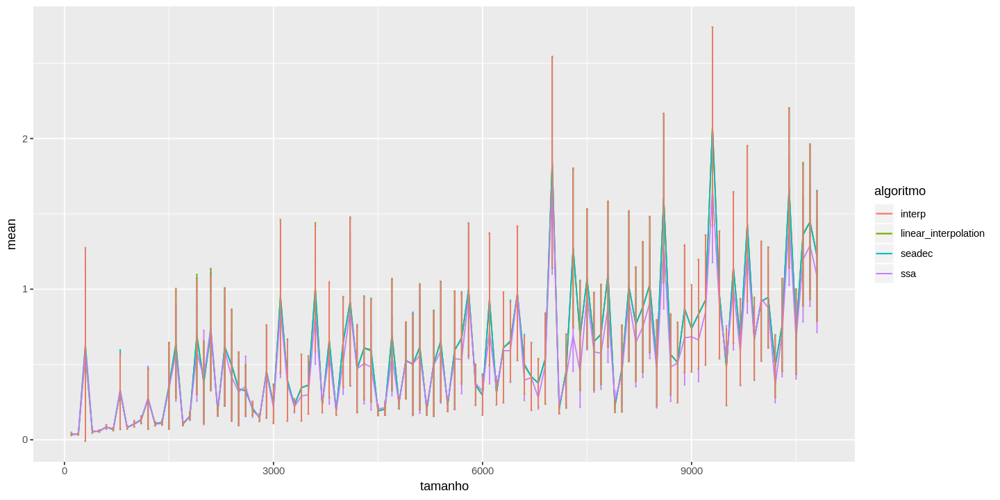

In [31]:
options(repr.plot.width=12, repr.plot.height=6)
    ggplot(todosMedia[which(todosMedia$algoritmo=="interp"| todosMedia$algoritmo=="linear_interpolation" | todosMedia$algoritmo=="seadec"| todosMedia$algoritmo=="ssa") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +

    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())


Nota
===
Os algoritmos Seasplit e SSA apresentam comportamentos distintos. 
De 100 a 3000 o SSA é melhor que o Seasplit, entretanto, após esse pontos os dois convergem para a igualdade. 

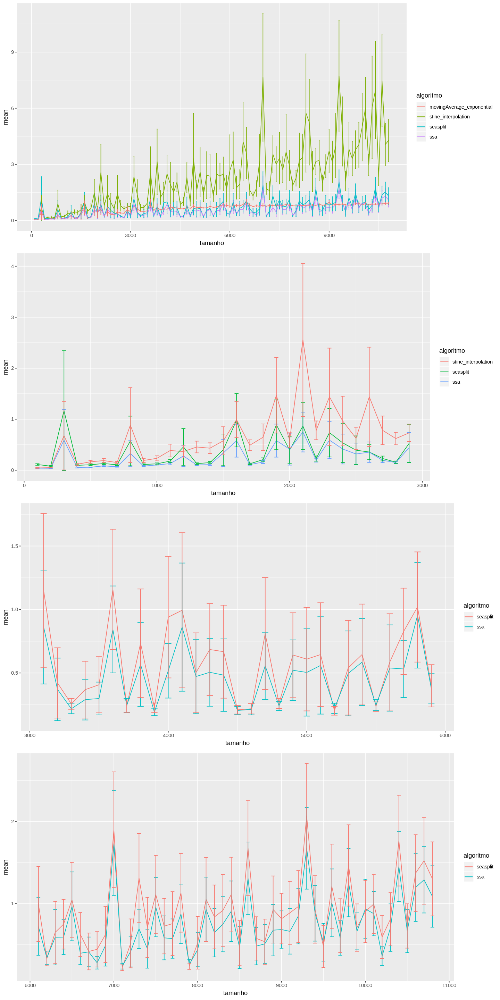

In [32]:
options(repr.plot.width=12, repr.plot.height=24)
   q1= ggplot(todosMedia[which(todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" |  todosMedia$algoritmo=="movingAverage_exponential" |  todosMedia$algoritmo=="stine_interpolation") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

q2=ggplot(todosMedia[which((todosMedia$tamanho<3000) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" | todosMedia$algoritmo=="stine_interpolation")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

q3=ggplot(todosMedia[which((todosMedia$tamanho>3000 & todosMedia$tamanho<6000 ) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa" )) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

q4=ggplot(todosMedia[which((todosMedia$tamanho>6000) & (todosMedia$algoritmo=="seasplit"| todosMedia$algoritmo=="ssa")) ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    #geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())
grid.arrange(q1,q2,q3,q4, ncol=1)

In [33]:
a= todosMedia
#by_alg=arrange(a, tamanho, mean)
by_alg=group_by(a, tamanho, algoritmo)
by_length=summarise(by_alg, media=min(mean))
a=by_length%>% filter(media==min(media))
a

tamanho,algoritmo,media
100,seadec,0.03466503
200,linear_interpolation,0.03630796
300,movingAverage_exponential,0.44860742
400,ssa,0.05379208
500,linear_interpolation,0.05557689
600,ssa,0.08482801
700,ssa,0.06639480
800,movingAverage_exponential,0.26431760
900,linear_interpolation,0.08015819
1000,ssa,0.10307295


Métrica: MSE
---

In [34]:
todosMedia=todos %>%
  group_by(algoritmo, tamanho) %>%
  summarize(mean = mean(mse, na.rm = TRUE))
#head(todosMedia)

In [35]:
options(repr.plot.width=12)
mse=ggplot(todosMedia, aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    ggtitle("MSE")+  theme(plot.title = element_text(hjust = 0.5, size=9))+
    theme(plot.title = element_text(hjust = 0.5, size=10))

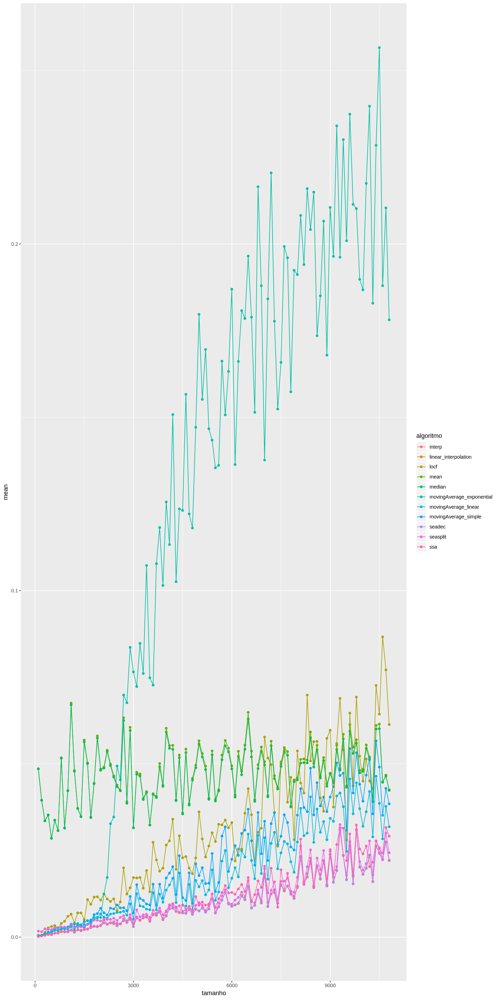

In [36]:
options(repr.plot.width=12)
    ggplot(todosMedia[which(todosMedia$tamanho<40000 & todosMedia$algoritmo!="spline_interpolation"  & todosMedia$algoritmo!="mode"  & todosMedia$algoritmo!="stine_interpolation" 
),], aes(x=tamanho, y=mean, colour=algoritmo))+
geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

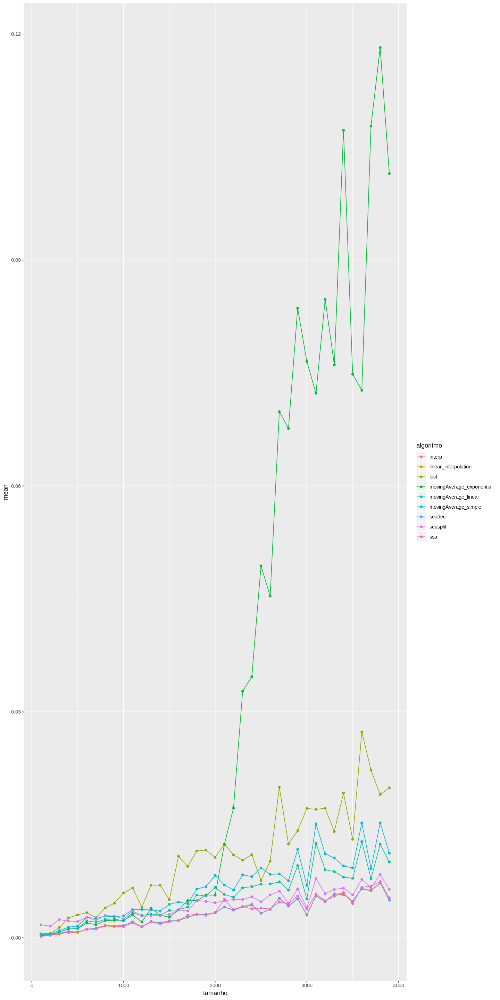

In [37]:
options(repr.plot.width=12)
    ggplot(todosMedia[which(todosMedia$tamanho<4000 & todosMedia$algoritmo!="spline_interpolation"  & todosMedia$algoritmo!="mode" & todosMedia$algoritmo!="median"  & todosMedia$algoritmo!="mean" & todosMedia$algoritmo!="stine_interpolation" 
),], aes(x=tamanho, y=mean, colour=algoritmo))+
geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

In [38]:
a= todosMedia
#by_alg=arrange(a, tamanho, mean)
by_alg=group_by(a, tamanho, algoritmo)
by_length=summarise(by_alg, media=min(mean))
a=by_length%>% filter(media==min(media))
a

tamanho,algoritmo,media
100,linear_interpolation,0.0001852747
200,linear_interpolation,0.0003317610
300,linear_interpolation,0.0005018356
400,ssa,0.0007384049
500,linear_interpolation,0.0007171605
600,ssa,0.0011330262
700,ssa,0.0011618033
800,linear_interpolation,0.0015814857
900,linear_interpolation,0.0015093824
1000,ssa,0.0014897807


Métrica: MAE
---

In [39]:
todosMedia=todos %>%
  group_by(algoritmo, tamanho) %>%
  summarize(mean = mean(mae, na.rm = TRUE))
#head(todosMedia)

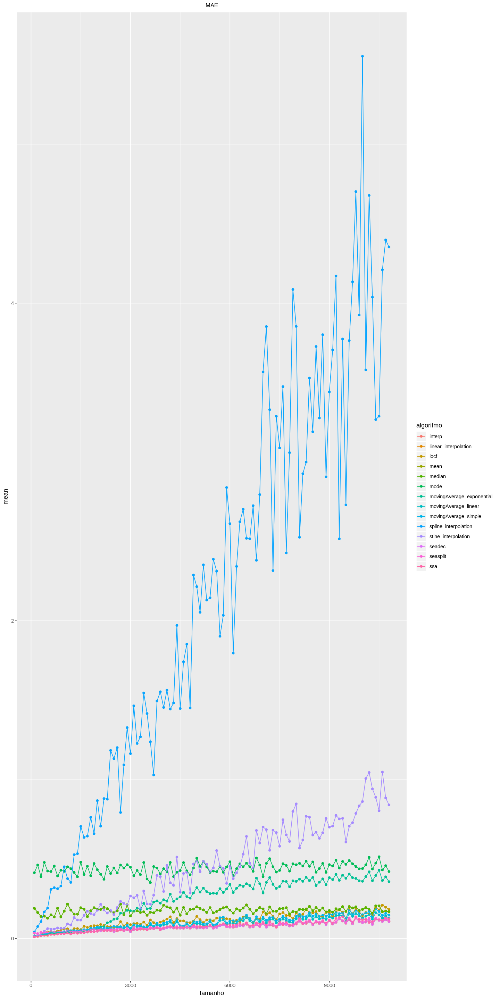

In [40]:
options(repr.plot.width=12)
mae=ggplot(todosMedia, aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    ggtitle("MAE")+  theme(plot.title = element_text(hjust = 0.5, size=9))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
mae

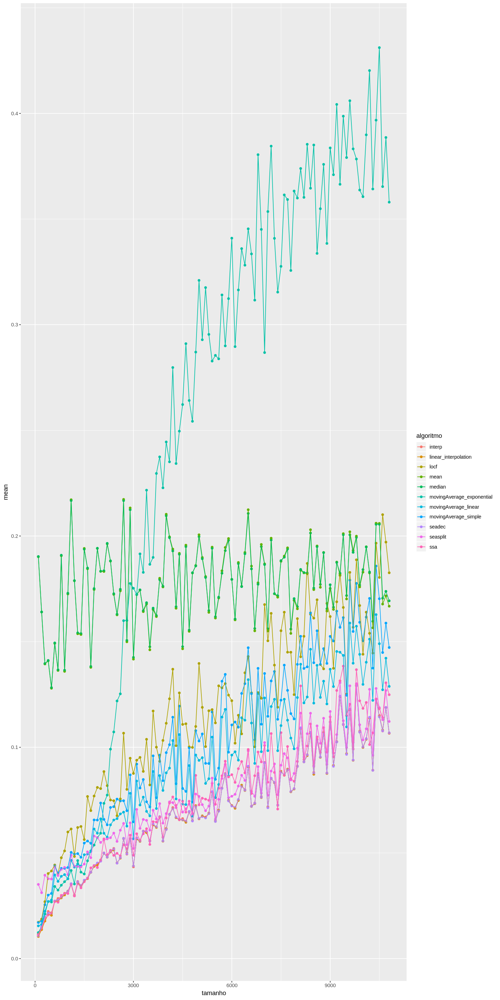

In [41]:
options(repr.plot.width=12)
    ggplot(todosMedia[which(todosMedia$tamanho<40000 & todosMedia$algoritmo!="spline_interpolation"  & todosMedia$algoritmo!="mode"  & todosMedia$algoritmo!="stine_interpolation" 
),], aes(x=tamanho, y=mean, colour=algoritmo))+
geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

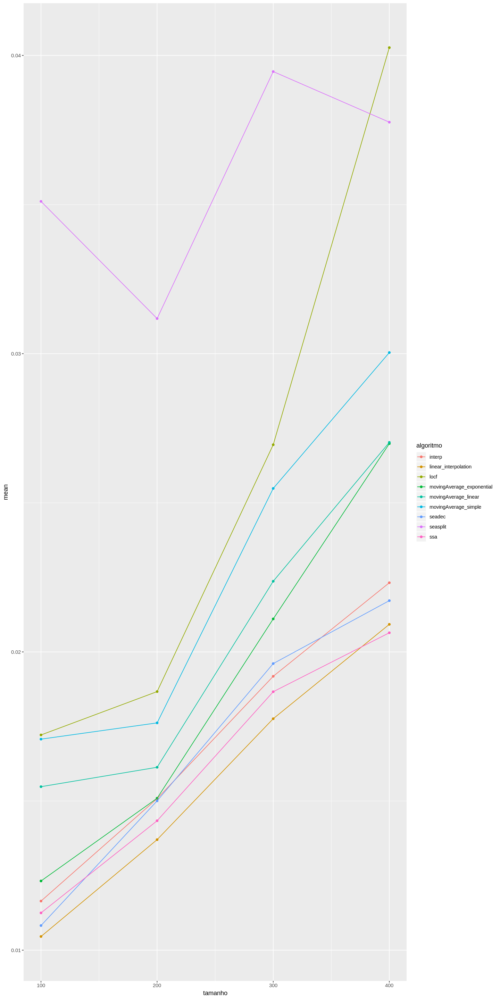

In [42]:
options(repr.plot.width=12)
    ggplot(todosMedia[which(todosMedia$tamanho<500 & todosMedia$algoritmo!="spline_interpolation"  & todosMedia$algoritmo!="mode" & todosMedia$algoritmo!="median"  & todosMedia$algoritmo!="mean" & todosMedia$algoritmo!="stine_interpolation" 
),], aes(x=tamanho, y=mean, colour=algoritmo))+
geom_point()+
    geom_line()+
      #  theme(axis.text=element_text(size=1))+
    theme(plot.title = element_text(hjust = 0.5, size=10))
     #   theme(axis.text=element_text(size=5),axis.title=element_blank())

In [43]:
a= todosMedia
#by_alg=arrange(a, tamanho, mean)
by_alg=group_by(a, tamanho, algoritmo)
by_length=summarise(by_alg, media=min(mean))
a=by_length%>% filter(media==min(media))
a

tamanho,algoritmo,media
100,linear_interpolation,0.01045886
200,linear_interpolation,0.01370574
300,linear_interpolation,0.01776018
400,ssa,0.02064181
500,linear_interpolation,0.02050021
600,ssa,0.02696202
700,ssa,0.02666826
800,linear_interpolation,0.02873644
900,linear_interpolation,0.03012252
1000,ssa,0.03080239


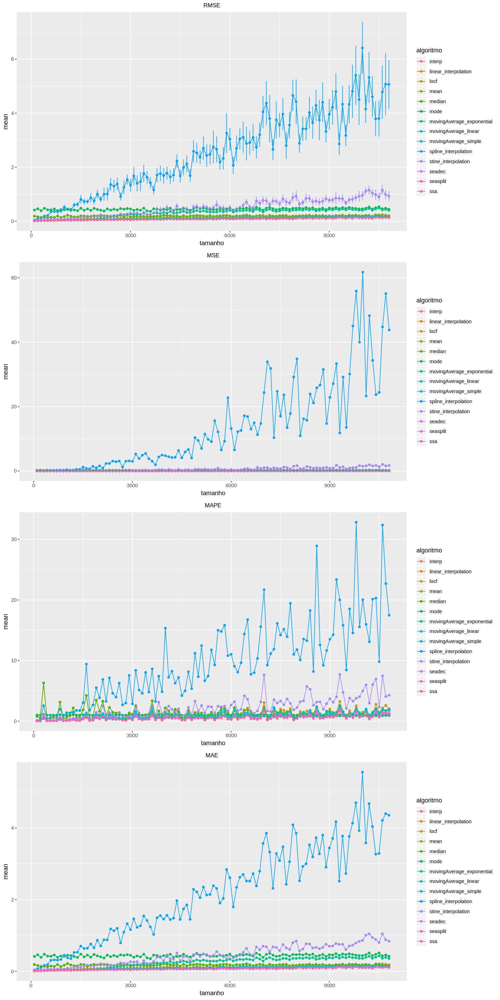

In [44]:
grid.arrange(rmse, mse, mape,mae, ncol=1)

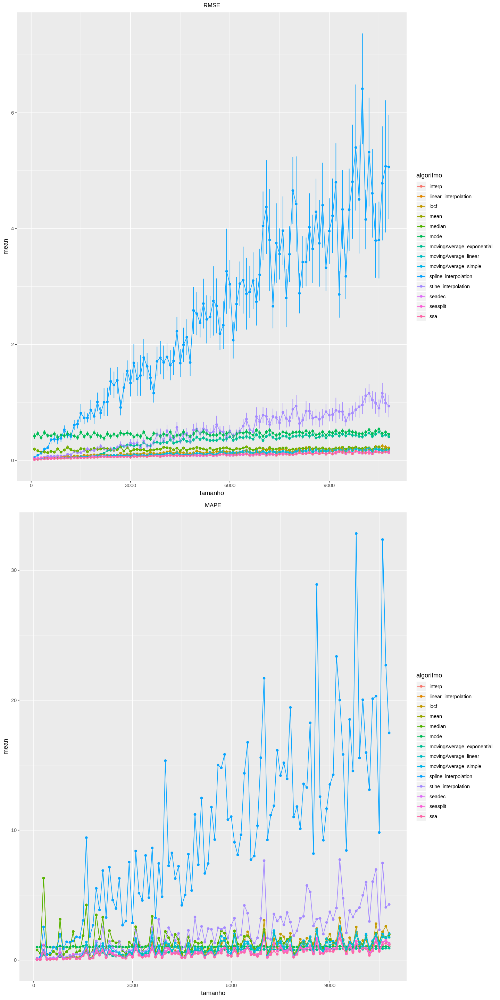

In [45]:
grid.arrange(rmse,mape, ncol=1)


Tempo
==


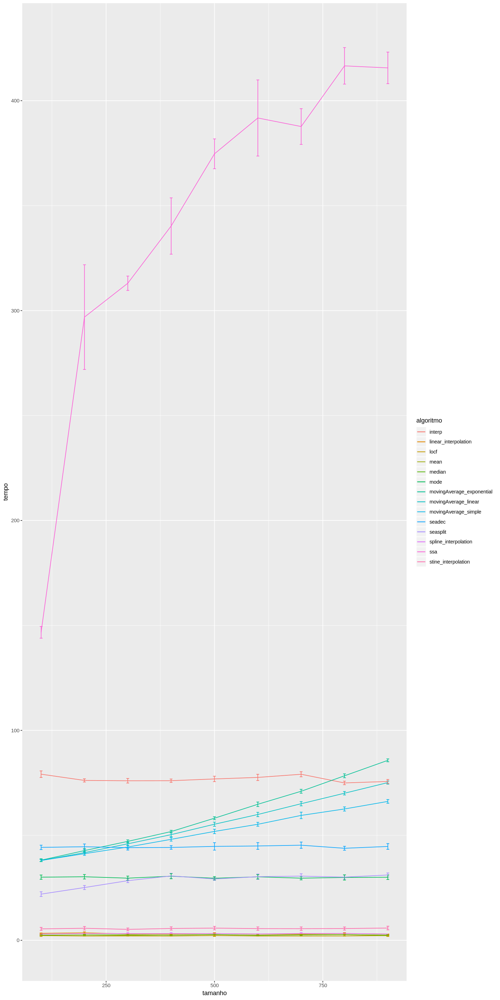

In [46]:
algoritmo=read.table("../expOriginal/time/alg.txt")
tempo=read.table("../expOriginal/time/tempo.txt")
a=as.data.frame(cbind(algoritmo, tempo))
names(a)=c("algoritmo", "tempo")
a$tamanho=rep(seq(100,10800,100), each=30)
a$tempo=as.numeric(hms(a$tempo))

b=a

mediaTempo= a %>% group_by(algoritmo, tamanho) %>%
summarize(tempo = mean(tempo, na.rm = TRUE))

sdTempo = a %>% group_by(algoritmo, tamanho) %>%
summarize(sd=sd(tempo, na.rm=TRUE))
mediaTempo$sd=sdTempo$sd

n=30 #tamanho da amostra. Ou seja, tem 30 lacunas de tamanho 100, 30 de tamanho 200...
error=qnorm(0.975)*mediaTempo$sd/sqrt(n)
mediaTempo$error=error
# The errorbars overlapped, so use position_dodge to move them horizontally
pd <- position_dodge(0.2) # move them .05 to the left and right



algTempo=ggplot(mediaTempo, aes(x=tamanho, y=tempo, colour=algoritmo))+
	geom_line()+
    geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) 
    #+geom_point()

ggplot(mediaTempo[which(mediaTempo$algoritmo=="" | mediaTempo$tamanho<1000),], aes(x=tamanho, y=tempo, colour=algoritmo))+
geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) +
geom_line()#+ geom_point()


Médias móveis
==

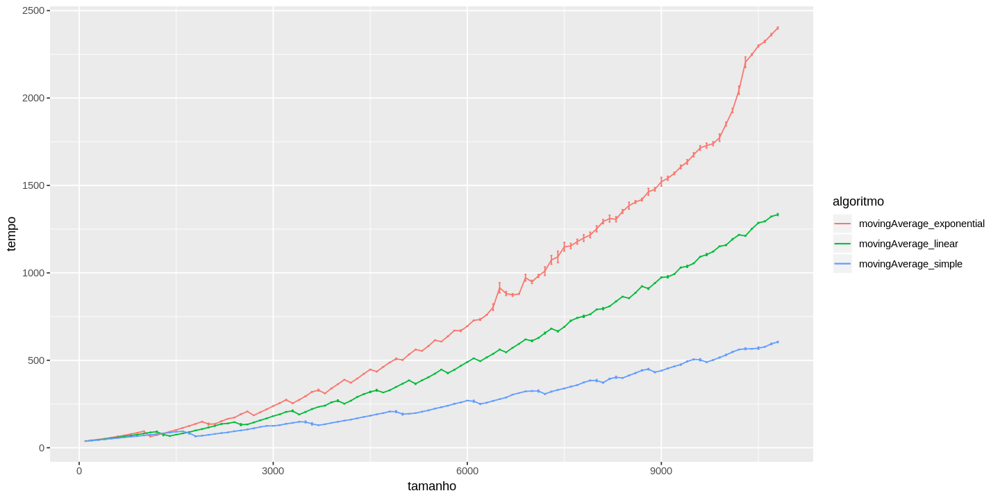

In [47]:
options(repr.plot.width=12, repr.plot.height=6)
ggplot(mediaTempo[which((mediaTempo$algoritmo=="movingAverage_linear" | mediaTempo$algoritmo=="movingAverage_exponential" | mediaTempo$algoritmo=="movingAverage_simple")),], aes(x=tamanho, y=tempo, colour=algoritmo))+
geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) +
geom_line()#+ geom_point()

Media, mediana e moda
===
Média e mediana tem melhores tempos, entretando na média. 
Moda é ruim em tempo e RMSE. 
Media e mediana são equivalente, entretanto optoo-se por usar a média.


In [48]:
options(repr.plot.width=12, repr.plot.height=6)
t1=ggplot(mediaTempo[which((mediaTempo$algoritmo=="mean" | mediaTempo$algoritmo=="median" | mediaTempo$algoritmo=="locf")),], aes(x=tamanho, y=tempo, colour=algoritmo))+
geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) +
geom_line()#+ geom_point()


rmse1= ggplot(todosMedia[which(todosMedia$algoritmo=="mean" | todosMedia$algoritmo=="median" | todosMedia$algoritmo=="locf") ,], aes(x=tamanho, y=mean, colour=algoritmo))+
    geom_point()+
    geom_line()+
    geom_errorbar(aes(ymin=mean-error, ymax=mean+error), position=pd) +
    theme(plot.title = element_text(hjust = 0.5, size=10))

grid.arrange(t1, rmse1, ncol=1)
                  

Warning message in mean - error:
“longer object length is not a multiple of shorter object length”Warning message in mean + error:
“longer object length is not a multiple of shorter object length”

ERROR: Error: Aesthetics must be either length 1 or the same as the data (324): ymin, ymax


In [ ]:
options(repr.plot.width=12, repr.plot.height=6)
ggplot(mediaTempo[which((mediaTempo$algoritmo=="spline_interpolation" | mediaTempo$algoritmo=="stine_interpolation" | mediaTempo$algoritmo=="linear_interpolation" | mediaTempo$algoritmo=="locf") & mediaTempo$tamanho<10000),], aes(x=tamanho, y=tempo, colour=algoritmo))+
geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) +
geom_line()#+ geom_point()

In [ ]:
tempoMelhores= options(repr.plot.width=12, repr.plot.height=6)
ggplot(mediaTempo[which((mediaTempo$algoritmo=="stine_interpolation" | mediaTempo$algoritmo=="ssa" | mediaTempo$algoritmo=="movingAverage_linear" | mediaTempo$algoritmo=="locf" | mediaTempo$algoritmo=="seasplit") & mediaTempo$tamanho<10000),], aes(x=tamanho, y=tempo, colour=algoritmo))+
geom_errorbar(aes(ymin=tempo-error, ymax=tempo+error), position=pd) +
geom_line()
rmseMelhores

In [ ]:
grid.arrange(algTempo, rmse, ncol=1)